# ASSIGNMENT 1

## Setting Up Environment

In [131]:
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
import math
from time import process_time
import time

## 1. Michael Scott’s Storage Conundrum
### q1.
Given that the aspect ratio is : $4:3$  
(ratio between the width and height of the image)  
and the size of the given image is : $5.76MB$  
pixel resolution = $4x*3x$  
We have $size~=~pixel~ resolution~*~bits~per~pixel$  
$\because bits~per~pixel~$ for a colored image is $24~bpp$  
$5.76*10^6*8~=~4x*3x*24 \\ 9x^2~=~1.44*10^6\\x^2~=~0.16*10^6\\x~=~\sqrt{0.16*10^6} \\x~=~400$  
Thus, the dimensions are: $4x = 1600$ and  
$3x = 1200$.  
Thus, **width = 1600** and **height = 1200**.

### q2.
Given that the images are of side length 5200 pixels
 l (square side) =  5200
Let total number of pixels in each image be N.
$$ N=l * 2=(5200)*2=2704∗104~~~pixels$$

##### Maximum images to be taken = 2000

(a) black and white images
Since each pixel can either be black or white, ∴ each pixel value = 2 bits



Now, for 1 image the required storage space $A ~=~ 2∗N~=~2∗704∗104 ~=~5408∗104~~~~bits$

For 2000 images store space = $2000∗A= 10816∗107~bits$
$Storage~=~1352∗10~−~2~=~13.52~GB~$

64GB memory cards required = ⌈13.5264⌉ = 1

##### ∴ He will need **1** memory card.

(b) Grayscale Images
For grayscale images, 1 pixel contains 1 byte
Storage space required for 1 image $A = 1∗N = 2704∗104~bytes$

For 2000 images, storage space size $T= 2000∗A =2000∗2704∗104$

⟹T=5408∗107 bytes
⟹T=54.08GB
 64GB memory cards required = ⌈54.0864⌉=1

##### ∴ He will need 1 memory card.

(c) Colored images
In colored images, each pixel has 3 channels each of 1 byte.
∴ 1 pixel = 3 bytes

Storage space required for 1 image A = 3∗N = 8112∗104bytes

For 2000 images storage space size T= 2000∗A =2000∗8112∗104

⟹T=16224∗107 bytes
⟹T=162.24GB
 64GB memory cards required = ⌈162.2464⌉=⌈2.535⌉ = 3

##### ∴ He will need 3 memory cards.

### q3.



We know that the number of pixels on the screen when translated to the bill board is constant but the length of the screen is much smaller than that of the bill-board.


Despite the increase in size of image, the number of pixels are still the same as that on the screen. Upon putting up the picture, the pixels get distributed over the larger length and the resolution is reduced to lot smaller number as resolution is the number of pixels available for a given length.
Due to this change in the resolution, the image appears less clearer or "pixelated".

## 2. Threat Level Midnight: 
### q1. 
Chroma Keying is the technique of layering two images based on color hues. Generally bright green is used for this purpose because it’s the color most differnt from human skin tones. Even for the foreground image provided, this can be observed, which helps us replace the green pixels with that of any background we wish for.

In [132]:
# Function to take a color image and find the most frequently occurring color from the image
def mostfreq(img):
  freq = dict()
  for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            color = tuple(img[i, j])
            if color in freq:
                freq[color] += 1
            else:
                freq[color] = 1
  mostFrequentColor = max(freq, key=freq.get)
  return (mostFrequentColor, freq[mostFrequentColor])

((5, 246, 5), 6267)


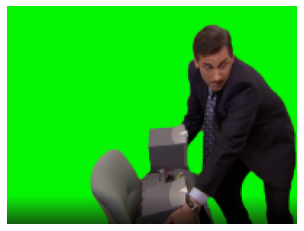

In [133]:
# Testing with the foreground.png in imgs folder which is mostly green
img = cv2.imread("../imgs/foreground.png")
img = cv2.resize(img,(200,150))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.axis('off')
print(mostfreq(img))

### q2.

In [134]:
# function which takes two images fg and bg that extracts the foreground object and places it 
# in the background and returns the resultant image

def mergeImage(fg, bg):
    fg = cv2.resize(fg,(800,600))
    bg = cv2.resize(bg, ( 800, 600))

    image_copy = fg
    
    lower_g = np.array([0, 100, 0])     # (r,g,b)
    upper_g = np.array([100, 255, 100 ])
    mask = cv2.inRange(image_copy, lower_g, upper_g)
    masked_fg = np.copy(image_copy)
    masked_fg[mask != 0] = [0, 0, 0]

    bg[mask == 0] = [0, 0, 0]

    return bg + masked_fg

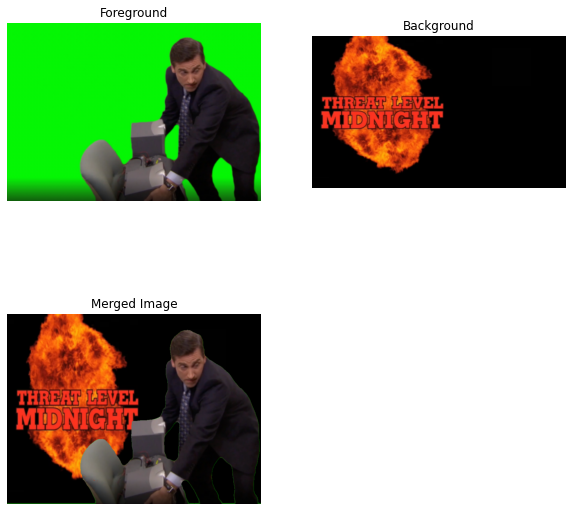

In [135]:
# Testing with the provided images
#reading and converting to RGB
fg = cv2.imread( ('../imgs/foreground.png'))
bg = cv2.imread( ('../imgs/background.png'))
fg = cv2.cvtColor(fg, cv2.COLOR_BGR2RGB)
bg = cv2.cvtColor(bg, cv2.COLOR_BGR2RGB)

fig = plt.figure(figsize = [10,10])
f1 = fig.add_subplot(2, 2, 1)
f1.title.set_text('Foreground')
plt.imshow(fg)
plt.axis('off')

f2 = fig.add_subplot(2, 2, 2)
f2.title.set_text('Background')
plt.imshow(bg)# bg image before being resized to fg dimensions
plt.axis('off')

f3 = fig.add_subplot(2, 2, 3)
f3.title.set_text('Merged Image')
plt.imshow(mergeImage(fg,bg))
plt.axis('off')

plt.show()


## 3. Broken Copier and Linear Transforms
### q1.

In [136]:
# function that implements a piecewise linear transform defined by 
# g(z) = K1[i]*z + K2[i] for a[i] <= z <= b[i]
# z - input intensity (generally ranging from 0 − 255)
# i - ith piecewise linear transform.
def piecewiseLinTransform(image, K1, K2, a, b):
  r = image.shape[0]
  c = image.shape[1]
  for i in range(r):
    for j in range(c):
      z = image[i][j]/255
      for k in range(len(K1)):
        if((z>=a[k]) and (z<b[k])):
          z = (K1[k]*z + K2[k])*255
          break
      image[i][j] = z

  return image

### q2. 
The piecewise function for pam1 is given as follows:

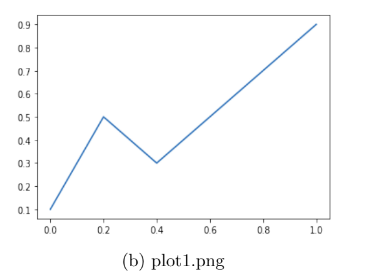

Thus, the function can be written as:
$y = \begin{cases} 
      2x+0.1 &, 0 \leq x < 0.2\\
      0.7-x &, 0.2 \leq x < 0.4 \\
      x-0.1 &, 0.4 \leq x < 1
   \end{cases}
$

The piecewise function for pam2 is given as follows:

Thus, the function can be written as:
$y = \begin{cases} 
      0 &, 0 \leq x < 0.2\\
      0.2 &, 0.2 \leq x < 0.4 \\
      0.4 &, 0.4 < x < 0.6 \\
      0.6 &, 0.6 \leq x < 0.8 \\
      0.8 &, 0.8 < x < 1 \\
      1 & , x = 1
   \end{cases}
$

Text(0.5, 1.0, 'Pam2 : Transformed Image')

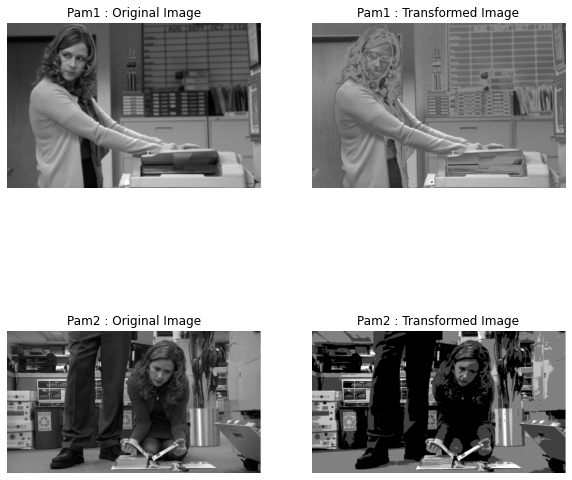

In [137]:
img1 = cv2.imread( '../imgs/pam1.png')
img2 = cv2.imread( '../imgs/pam2.png')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
a = [0.0, 0.2, 0.4]
b = [0.2, 0.4, 1.0]
K1 = [2.0, -1.0, 1.0]
K2 = [0.1, 0.7, -0.1]

t_img1 = img1.copy()
t_img1 = piecewiseLinTransform(t_img1, K1, K2, a, b)
# img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
# t_img1 = cv2.cvtColor(t_img1, cv2.COLOR_BGR2RGB)
a2 = [0.0, 0.2, 0.4, 0.6, 0.8, 1.0]
b2 = [0.2, 0.4, 0.6, 0.8, 1.0, 1.0]
K12 = [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
K22 = [0.0, 0.2, 0.4, 0.6, 0.8, 1.0]
t_img2 = img2.copy()
t_img2 = piecewiseLinTransform(t_img2, K12, K22, a2, b2)

fig = plt.figure(figsize = [10, 10])
ax = fig.add_subplot(221)
plt.imshow(img1, cmap='gray')
plt.axis('off')
plt.title('Pam1 : Original Image')
ax = fig.add_subplot(222)
plt.imshow(t_img1, cmap='gray')
plt.axis('off')
plt.title('Pam1 : Transformed Image')
ax = fig.add_subplot(223)
plt.imshow(img2, cmap='gray')
plt.axis('off')
plt.title('Pam2 : Original Image')
ax = fig.add_subplot(224)
plt.imshow(t_img2, cmap='gray')
plt.axis('off')
plt.title('Pam2 : Transformed Image')

### q3. 
The piecewise function to be applied is as follows:
$y = \begin{cases} 
      -1-x & 0 \leq x < 0.4\\
      x-1  & 0.4 \leq x < 0.6 \\
      1-x & 0.6 \leq x < 1.0 \\
   \end{cases}
$


The plot of the above piecewise lineaar function is as follows:

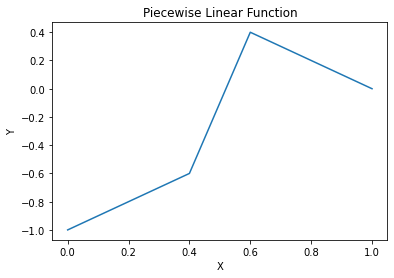

In [138]:
x = [0.0, 0.4, 0.6, 1.0]
y = [-1.0, -0.6,0.4, 0.0]
plt.plot(x, y)
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Piecewise Linear Function')
plt.show()

Text(0.5, 1.0, 'Transformed Image')

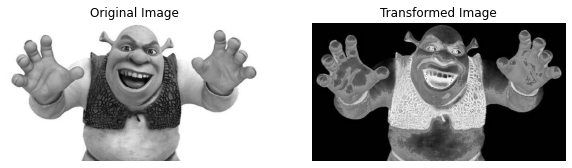

In [139]:
# Reading the image as img2
img2 = cv2.imread('../imgs/img2.jpg')
# Conveting to grayscale
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

a = [0.0, 0.4, 0.6]
b = [0.4, 0.6, 1.0]
K1 =  [-1.0, 1.0, -1.0]
K2 = [-1.0, -1.0, 1.0]

t_img2 = img2.copy()
t_img2 = piecewiseLinTransform(t_img2, K1, K2, a, b)

fig = plt.figure(figsize = [10, 10])
ax = fig.add_subplot(121)
plt.imshow(img2, cmap = "gray")
plt.axis('off')
plt.title('Original Image')
ax = fig.add_subplot(122)
plt.imshow(t_img2, cmap = "gray")
plt.axis('off')
plt.title('Transformed Image')

## 4. Slice Off the Unnecessary
### q1.

In [140]:
def bitSlice(im, k):
  im = im.copy()
  r  = im.shape[0]
  c = im.shape[1]
  for i in range(r):
    for j in range(c):
        n = im[i][j]
        val = (n >> (8-k))%2
        im[i][j] = val
  return im

### q2.

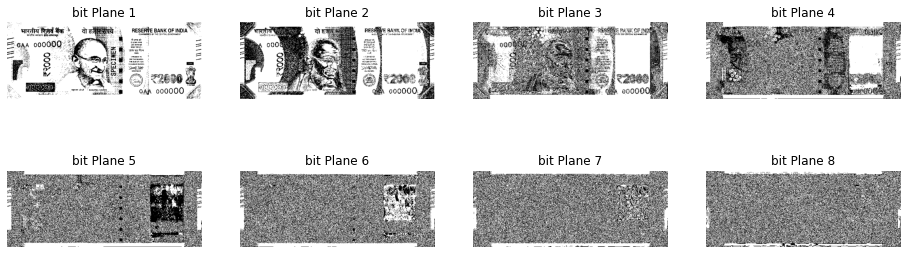

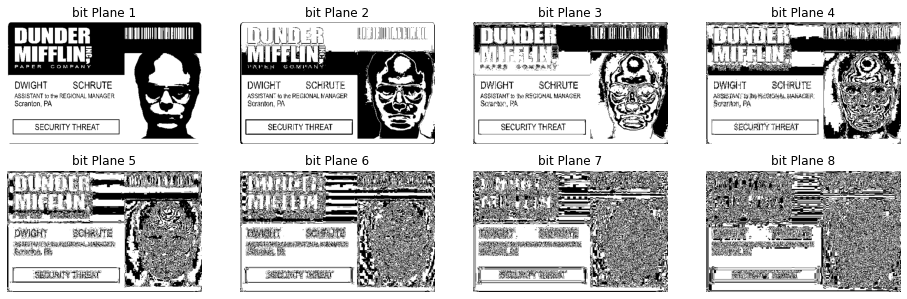

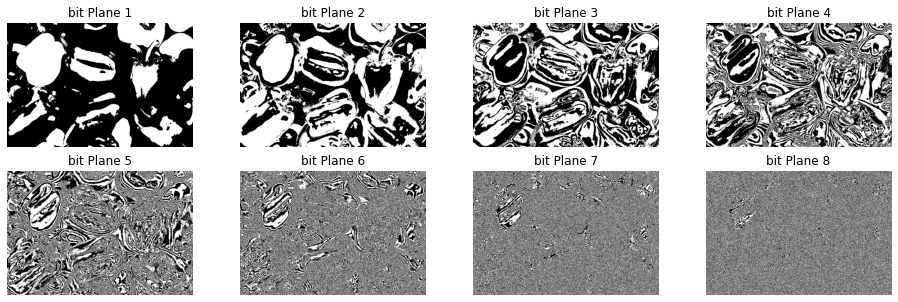

In [141]:
# Reading the image
rupee = cv2.imread('../imgs/rupee.jpg')
security = cv2.imread('../imgs/securityThreat.jpg')
pepper = cv2.imread('../imgs/pepper.jpg')
# Conveting to grayscale
rupee = cv2.cvtColor(rupee, cv2.COLOR_BGR2GRAY)
security = cv2.cvtColor(security, cv2.COLOR_BGR2GRAY)
pepper = cv2.cvtColor(pepper, cv2.COLOR_BGR2GRAY)
images = [rupee, security, pepper]
for im in images:
    plt.figure(figsize = (16,5))
    for j in range(1,9):
        plt.subplot(2,4,j)
        plt.imshow(bitSlice(im, j), cmap='gray')
        plt.title("bit Plane "+str(j))
        plt.axis('off')
    plt.show()  

### q3.

In [142]:
def imgBitQuantizer(im, k):
  im = im.copy()
  r  = im.shape[0]
  c = im.shape[1]
  for i in range(r):
    for j in range(c):
        n = im[i][j]
        im[i][j] = (n >> (8-k))
  return im

### q4.

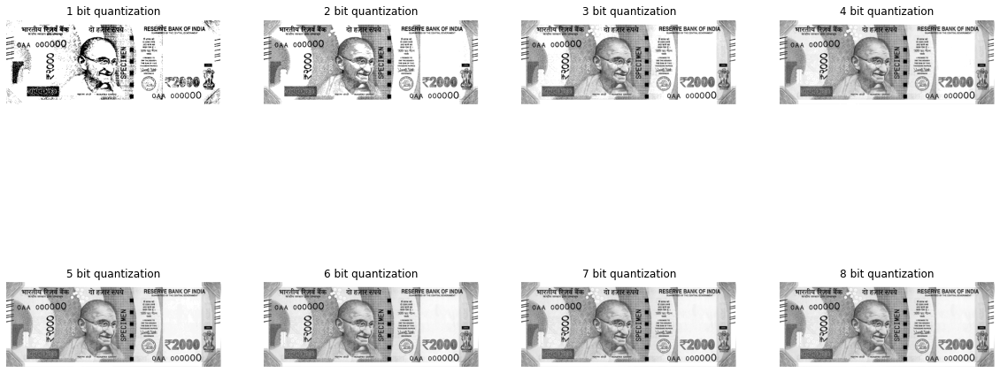

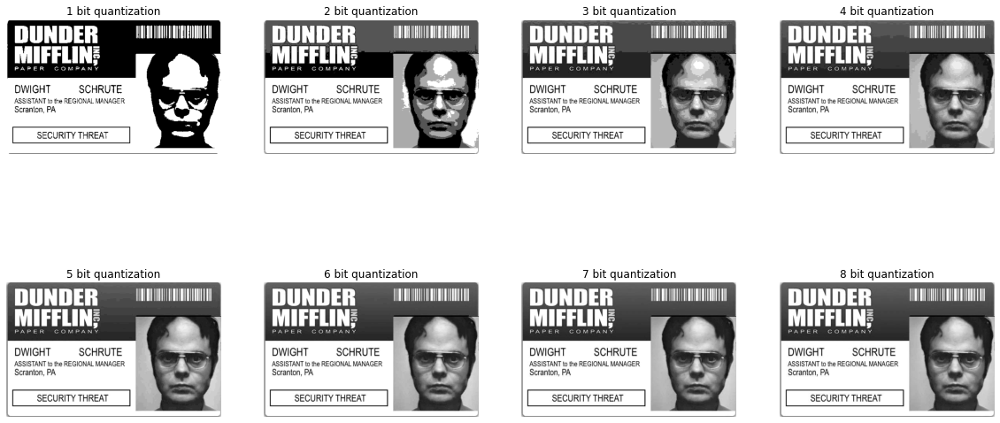

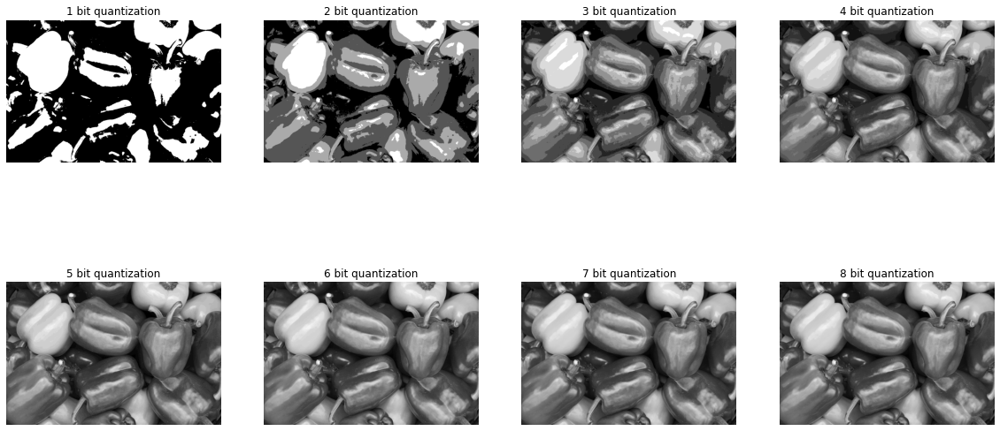

In [143]:
# Reading the image
rupee = cv2.imread('../imgs/rupee.jpg')
security = cv2.imread('../imgs/securityThreat.jpg')
pepper = cv2.imread('../imgs/pepper.jpg')
# Conveting to grayscale
rupee = cv2.cvtColor(rupee, cv2.COLOR_BGR2GRAY)
security = cv2.cvtColor(security, cv2.COLOR_BGR2GRAY)
pepper = cv2.cvtColor(pepper, cv2.COLOR_BGR2GRAY)
images = [rupee, security, pepper]
for im in images:
    plt.figure(figsize = (20,10))
    for j in range(1,9):
        plt.subplot(2,4,j)
        plt.imshow(imgBitQuantizer(im, j), cmap='gray')
        # plt.imshow(im, cmap='gray')
        plt.title(str(j)+" bit quantization")
        plt.axis('off')
    plt.show()     

We observe that the 8 bit planes depict the information contained in each bit and the bit plane-1 is the most clearer or the closest to the original picture implying that it is the MSB (most significant bit) and contains the most information.
In the quantization results we see that a k-bit quantized image contains the information from the $1^{\text{st}}$ to $k^{\text{th}}$ bit planes, thus, we observe that the 8-bit quantized image is the clearest as it is the combination of all bit planes.

### q5.(bonus)
Applications of bit slicing:

As we can obtain most of the information using the bit planes containing the MSBs, we can get back the image using only the higher bit planes. This helps largely in image compression, as the size of the image thus reduces.

So, an 8bit per pixel image can be compressed to having only 3 bits for example

## 5. Demystifying Magical Transformations 

### q1.
*a*) The gamma transform given by the equation : $s~=~c~r^\gamma$,
 where $s$ and $r$ are the output and input pixel values respectively, and $c$ and $\gamma$ are positive constants, they define the relationship between the input and resulting output.
Thus, $\gamma$ can take any values between $0$ to $\infin$



*b*) No, if $c=1$ the equation will not always return an intensity value within the $8$-bit range, that would only be always possible when $\gamma = 1$. To ensure that the transformed pixel intensity is within the $8$-bit range, we must normalise the image i.e. scale it to $[0,1]$ and then apply gamma ($\gamma$) on it, then multiplying the result with a scaling constant of $255$ for scaling it back to $[0,255]$ for satisfying the $8$-bit range. 

The modified equation looks as follows: 
$$s~=~ 255*(\frac{r}{255})^\gamma$$



*c*) We observe that $\gamma \gt 1$ shifts the image to the darker side of the spectrum, whereas $\gamma \lt 1$ makes the image appear brighter. Power law curve with $\gamma \lt 1$ maps a small range of dark input values into a wider range of output values, whereas, the opposite is true for $\gamma \lt 1$. Impying that the human eye is more sensitive to changes in the dark as compared to changes in bright tones.


While, $\gamma = 1$ has no effect on the input pixel intensity as $$s~=~ 255*\frac{r}{255}~=~ \sout{255}*\frac{r}{\sout{255}}~=~r$$



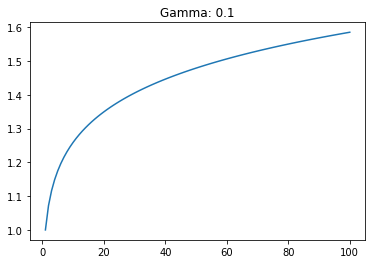

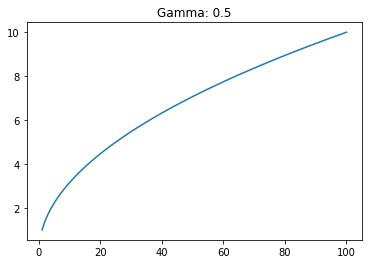

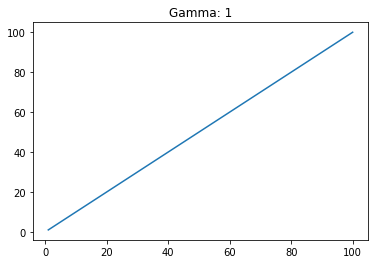

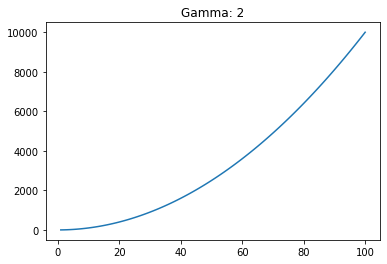

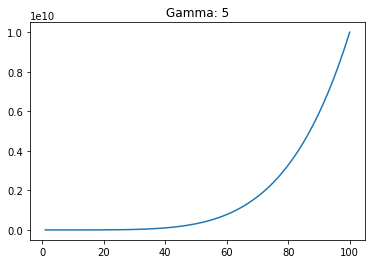

In [144]:
x = np.linspace(1, 100, 100)

for g in [0.1,0.5,1,2,5]:
    y = x**g 
    plt.figure()
    plt.title("Gamma: " + str(g))
    plt.plot(x, y)

### q2.

In [145]:
def powerLawTransform(im, gamma):
    im = im.copy()
    for i in range(im.shape[0]):
        for j in range(im.shape[1]):
            im[i][j] = 255*pow((im[i][j]/255),gamma)
    return im

### q3.

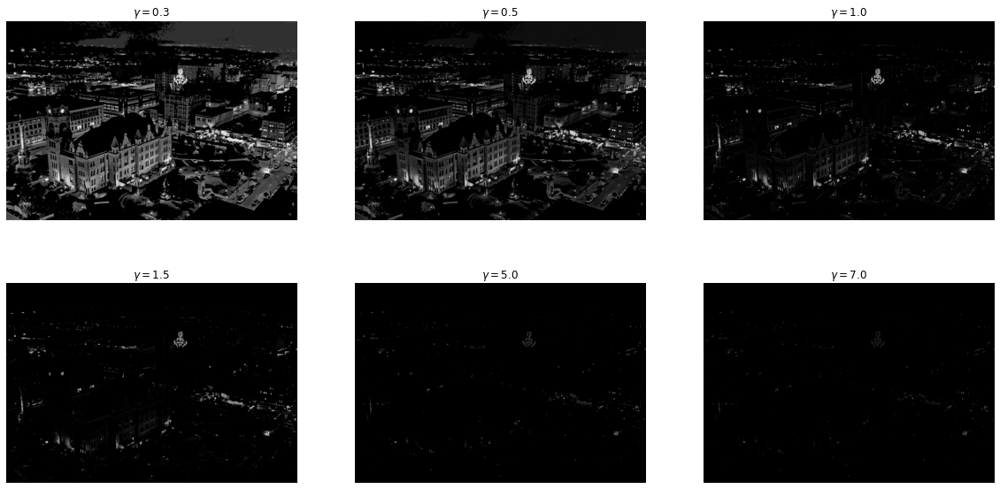

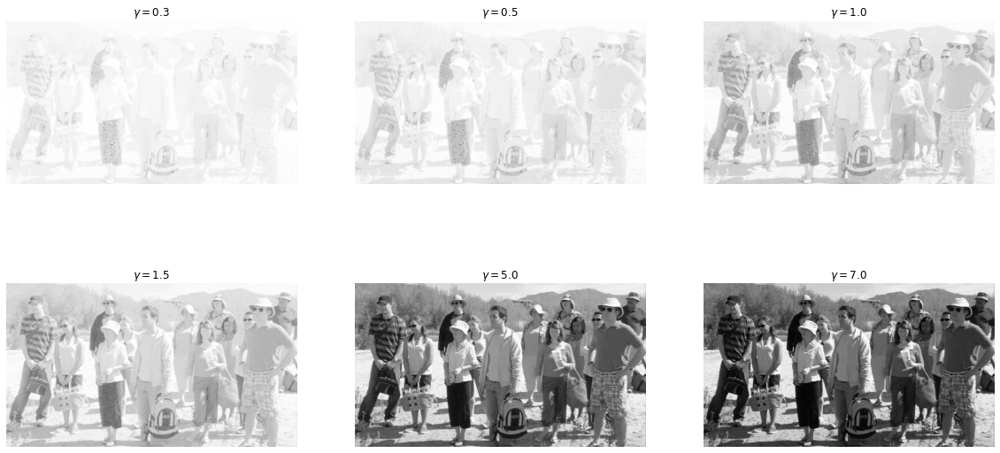

In [146]:
img1 = cv2.imread('../imgs/scrantonAreal.png')
img2 = cv2.imread('../imgs/tripGrpPhoto.png')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
images = [img1, img2]
gamma = [0.3, 0.5, 1.0, 1.5, 5.0, 7.0]
for im in images:
    plt.figure(figsize = (20,10))
    for j in range(1,7):
        plt.subplot(2,3,j)
        plt.imshow(powerLawTransform(im, gamma[j-1]), cmap='gray')
        # plt.imshow(im, cmap='gray')
        plt.title("$\gamma = $"+ str(gamma[j-1]))
        plt.axis('off')
    plt.show() 
    

We see that ```scrantonArea1.png``` is a very dark image and thus, it is enhanced by applying a $\gamma \lt 1$, more precicely, $\gamma = 0.3$ seemed the most appropriate to me. Similarly, ```tripGrpPhoto.png``` is a very bright image and to enhance it we msut apply a $\gamma \gt 1$, we observe that $\gamma  = 7.0$ seems apt for the image.

We also notice a pattern as $\gamma $ value is increased from $0.3$ to $7.0$, the images appear darker and darker. The image at $\gamma = 1$ is the provided poor image, as can be seen, $\gamma \lt 1$ produces brighter, whereas, $\gamma \gt 1$ produces darker image as shown above.


### q4.

*a*) We can use the log transform to obtain a similar effect. The mathematical expression for which is s = c(1+log(r)), where r is the original intensity, s is the resultant intensity and c is a constant

Let us take c=10 for our example. 

*b*) As we can see the log transform funnction plot is similar to power-law transfrom for when gamma<1.

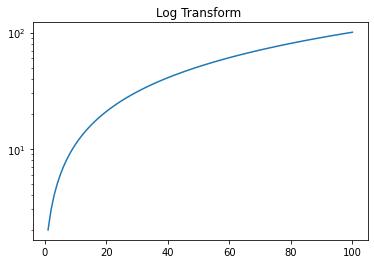

In [147]:
x = np.linspace(1, 100, 100)
y = (1 + x)

plt.yscale('log',base=10) 
plt.title("Log Transform ")
plt.plot(x, y)

*c*)

In [148]:
def logTransform(im):
  # Apply log transformation method
  c = 10
  im = im.astype(np.float64)
  im = im / 255
  im = c*np.log(im + 1) 
  im = im * 255 
  im = im.astype(np.uint8)
  return im


*d*)

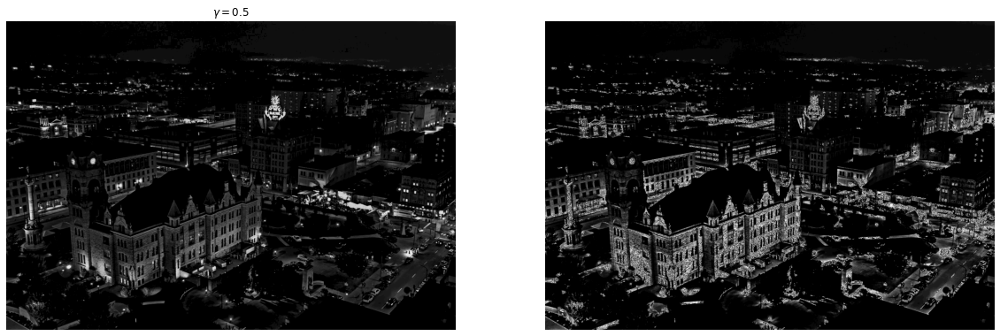

In [149]:
img1 = cv2.imread('../imgs/scrantonAreal.png')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

plt.figure(figsize = (20,10))
plt.subplot(1,2,1)
plt.imshow(powerLawTransform(img1, 0.5), cmap='gray')
plt.title("$\gamma = $"+ str(0.5))
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(logTransform(img1), cmap='gray')
plt.axis('off')
plt.show() 
    

We notice that as compared to gamma transform, the details look blurred in the log transform. The details are not very well preserved

## 6. The Man With the Most Experience 
### q1.

In [150]:
def histogramEqualization(greyimg):
  prob = np.zeros(256)
  for i in range(256):
    cdf = (greyimg <= i).sum()
    prob[i] = cdf*(1.0)/(greyimg.shape[0]*greyimg.shape[1]*1.0)
  
  value = np.round(255.0 * prob[greyimg])
  return value.astype(np.uint8)

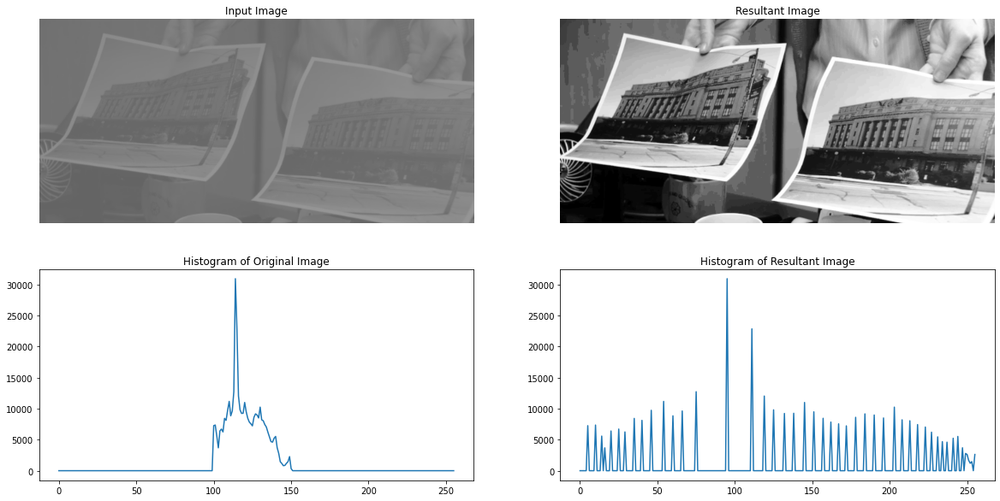

In [151]:
img1 = cv2.imread('../imgs/Same_picture.png')
img2 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = histogramEqualization(img2)

plt.figure(figsize = [20,10])
plt.subplot(2,2,1)
plt.imshow(img1)
plt.title("Input Image")
plt.axis('off')

plt.subplot(2,2,2)
plt.imshow(img2, cmap='gray')
plt.title("Resultant Image")
plt.axis('off')

plt.subplot(2,2,3)
plt.plot(cv2.calcHist([img1], [0], None, [256], [0, 256]))
plt.title("Histogram of Original Image")
plt.subplot(2,2,4)
plt.plot(cv2.calcHist([img2], [0], None, [256], [0, 256]))
plt.title("Histogram of Resultant Image")
plt.show() 

As can be observed from the images, in the **resultant image** contrast has been enhanced and its histogram has also been equalized. The overall shape of the histogram has changed or rather been distributed or spread out.
The most frequent intensity values are spread out isntead of being concentrated at a place, i.e. the intensity range of the image is stretched out. This has greatly improved the quality of the image. Details are better visible in the histogram equalized image.

### q2.
*a*)

In [152]:
def histogramMatching(image, ref_image):
  image = histogramEqualization(image)
  prob = np.zeros(256)
  for i in range(256):
    cdf = (ref_image <= i).sum()
    prob[i] = (cdf*1.0)/(ref_image.shape[0]*ref_image.shape[1])

  result = np.searchsorted(prob, image/255)
  return result.astype(np.uint8)

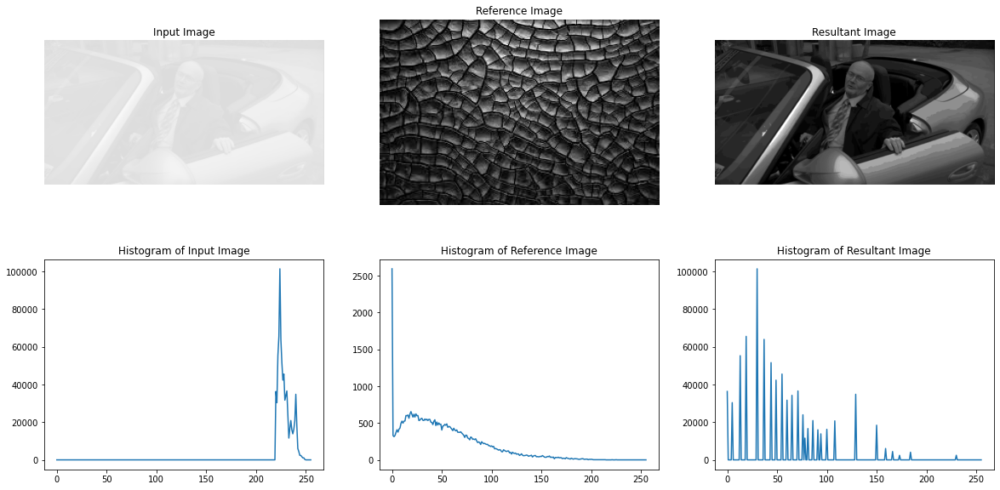

In [153]:
img = cv2.imread('../imgs/Creed.png')
ref_img = cv2.imread('../imgs/Texture.jpg',0)

plt.figure(figsize = [20,10])
plt.subplot(231)
plt.imshow(img)
plt.title("Input Image")
plt.axis('off')
plt.subplot(232)
plt.imshow(ref_img, cmap='gray')
plt.title("Reference Image")
plt.axis('off')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
result = histogramMatching(img,ref_img)

plt.subplot(233)
plt.imshow(result, cmap='gray')
plt.title("Resultant Image")
plt.axis('off')
plt.subplot(234)
plt.plot(cv2.calcHist([img], [0], None, [256], [0, 256]))
plt.title("Histogram of Input Image")
plt.subplot(235)
plt.plot(cv2.calcHist([ref_img], [0], None, [256], [0, 256]))
plt.title("Histogram of Reference Image")
plt.subplot(236)
plt.plot(cv2.calcHist([result], [0], None, [256], [0, 256]))
plt.title("Histogram of Resultant Image")
plt.show() 

*b*)

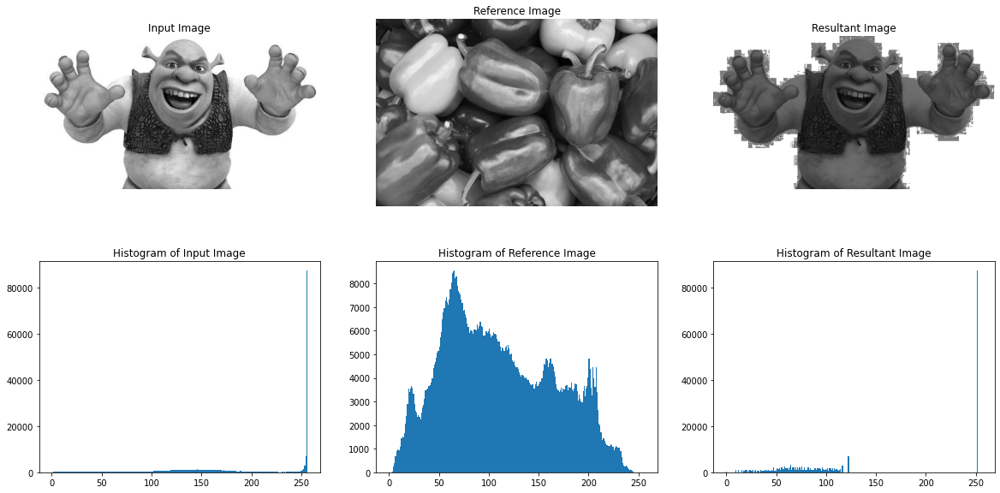

In [154]:
img = cv2.imread('../imgs/img2.jpg')
ref_img = cv2.imread('../imgs/pepper.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
ref_img = cv2.cvtColor(ref_img, cv2.COLOR_BGR2GRAY)
result = histogramMatching(img,ref_img)

plt.figure(figsize = [20,10])
plt.subplot(231)
plt.imshow(img, cmap = 'gray')
plt.title("Input Image")
plt.axis('off')
plt.subplot(232)
plt.imshow(ref_img, cmap = 'gray')
plt.title("Reference Image")
plt.axis('off')
plt.subplot(233)
plt.imshow(result, cmap = 'gray')
plt.title("Resultant Image")
plt.axis('off')
plt.subplot(234)
plt.hist(img.ravel(),256,[0,256])
plt.title("Histogram of Input Image")
plt.subplot(235)
plt.hist(ref_img.ravel(),256,[0,256])
plt.title("Histogram of Reference Image")
plt.subplot(236)
plt.hist(result.ravel(),256,[0,256])
plt.title("Histogram of Resultant Image")
plt.show() 

## 7. Don’t Neglect Your Neighbours 
## 7.1 Linear Spatial Filters 
### Mean Filter 
### q1.

In [155]:
def meanFilter(image, k):
    filter = np.full((k, k), 1/(k*k)) # a filter with all the entries of a k*k matrix as 1/k^2
    im = image.astype(np.float64)
    filter = filter.astype(np.float64)
  
    result = np.zeros(im.shape)
    n = int(filter.shape[0]/2)
    m = int((filter.shape[0]-1)/2)

    for i in range(n, im.shape[0]-m):
        for j in range(n, im.shape[1]-m):
           result[i][j] = max(0, sum(sum(filter*im[i-n:i+m+1, j-n:j+m+1])))
    return result.astype(np.uint8)

### q2. 

In [156]:
def effMeanFilter(image, k):
  row, column = image.shape
  if(k>row and k>column):
    return image

  sz = k*k
  pad = int(k/2)
  resultImage = np.zeros((row+2*pad, column+2*pad))
  resultImage[pad:resultImage.shape[0]-pad, pad:resultImage.shape[1]-pad] = image

  cumR = []
  for i in range(len(resultImage)):
    cumR.append(resultImage[i].cumsum())
  resultImage = resultImage.T

  cumC = []
  for i in range(len(resultImage)):
    cumC.append(resultImage[i].cumsum())
  resultImage = resultImage.T

  resultImage = resultImage.astype(np.float)
  for i in range(pad, resultImage.shape[0]-pad):
    for j in range(pad, resultImage.shape[1]-pad):
      if i==pad and j == pad:
        resultImage[pad][pad] = np.sum(resultImage[0:k,0:k]) / sz
        continue
      if j==pad:
        resultImage[i][j] = (resultImage[i-1][j]*sz + cumR[i+pad][k-1] - cumR[i-pad-1][k-1])/sz
        continue
      if i==pad:
        resultImage[i][j] = (resultImage[i][j-1]*sz + cumC[j+pad][k-1] - cumC[j-pad-1][k-1])/sz 
        continue
      resultImage[i][j] = (resultImage[i][j-1]*sz + cumC[j+pad][i+pad]+ cumC[j-pad-1][i-pad-1] - cumC[j+pad][i-pad-1] - cumC[j-pad-1][i+pad])/sz
  
  return np.rint(resultImage[pad:resultImage.shape[0] - pad, pad:resultImage.shape[1] - pad]).astype(np.uint8) 

(-0.5, 297.5, 299.5, -0.5)

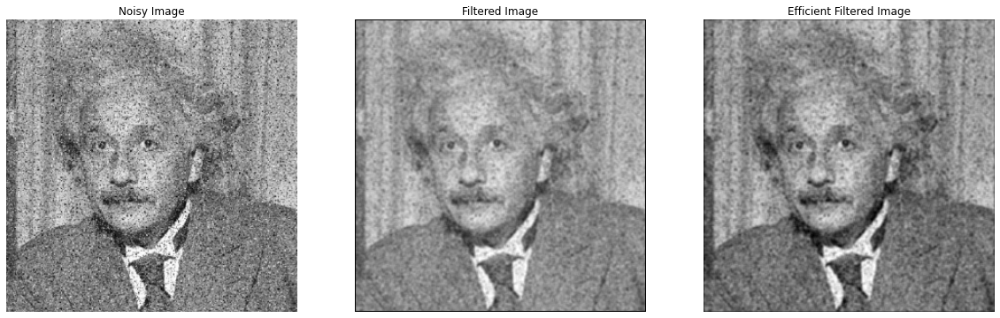

In [157]:
img =cv2.imread('../imgs/noisy.png',0)
fimg = meanFilter(img, 3)
fimg_2 = effMeanFilter(img,3)

plt.figure(figsize = (20,10))
plt.subplot(131)
plt.imshow(img, cmap='gray')
plt.axis('off')
plt.title('Noisy Image')

plt.subplot(132)
plt.imshow(fimg, cmap='gray')
plt.title('Filtered Image')
plt.axis('off')

plt.subplot(133)
plt.imshow(fimg_2, cmap='gray')
plt.title('Efficient Filtered Image')
plt.axis('off')

### q3.

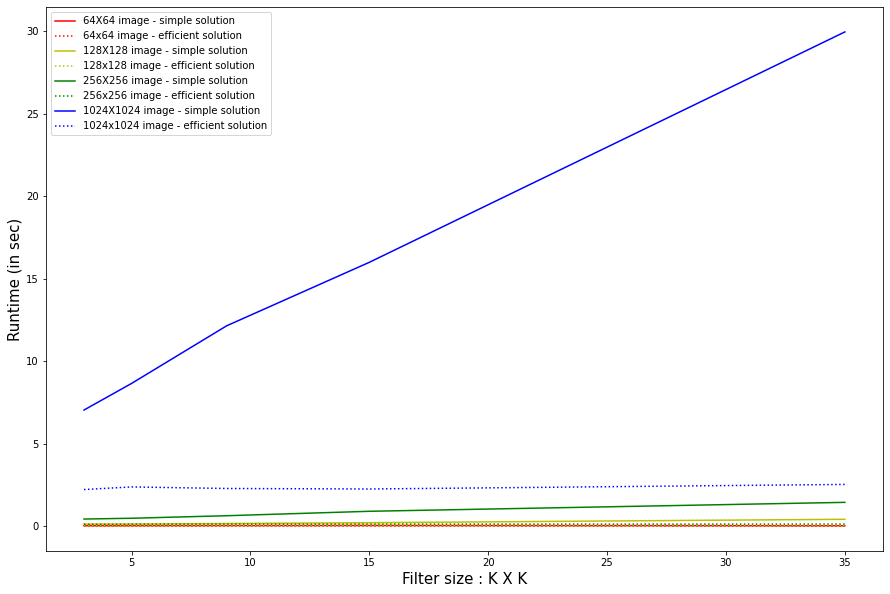

In [158]:
# Plot of filter size vs the run time of different implementations of averaging filter with images of different sizes
imageSize = [64, 128, 256, 1024]
filterSize = [3, 5, 9, 15, 35]

img =cv2.imread('../imgs/noisy.png',0)
imgCopy = img.copy()

marker = ['r', 'y', 'g', 'b', 'm', 'c', 'k']
plt.figure(figsize=(15, 10))
for sz in range(len(imageSize)):
  imgResize =  cv2.resize(imgCopy,(imageSize[sz], imageSize[sz]))
  naiveTimer = []
  optTimer = []

  for k in filterSize:
    start = process_time()
    meanFilter(imgResize, k)
    end = process_time()
    naiveTimer.append(end-start)

    start = process_time()
    effMeanFilter(imgResize, k)
    end = process_time()
    optTimer.append(end-start)

  plt.plot(filterSize, naiveTimer, marker[sz], label = str(imageSize[sz])+'X'+str(imageSize[sz])+' image - simple solution')
  plt.plot(filterSize, optTimer, marker[sz], linestyle = 'dotted', label = str(imageSize[sz])+'x'+str(imageSize[sz]) + ' image - efficient solution')

plt.xlabel('Filter size : K X K', fontsize = 15)
plt.ylabel('Runtime (in sec)', fontsize = 15)
plt.legend()

### q4.

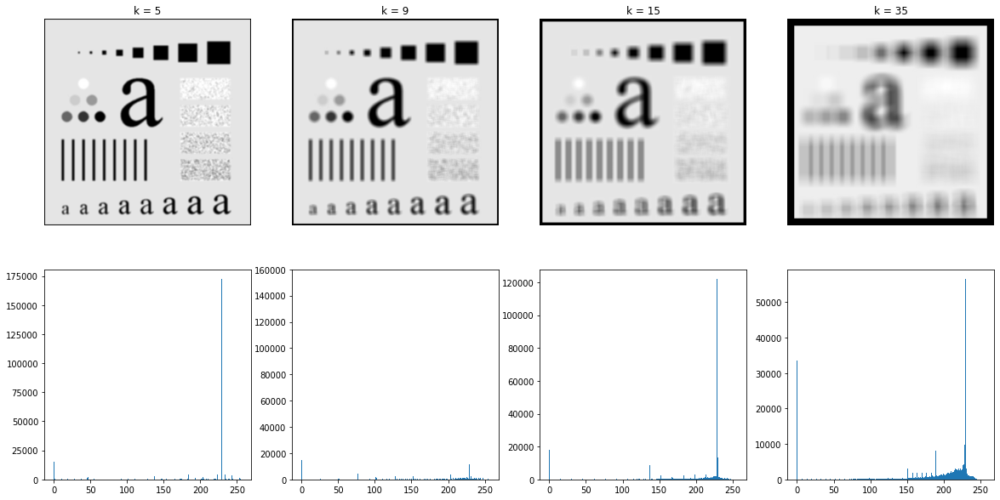

In [159]:
img=cv2.imread("../imgs/testPattern.jpg",0)
kernel = [5,9,15,35]

plt.figure(figsize = [20,10])
for i in range(0,4):
    plt.subplot(2,4,i+1)
    fimg = meanFilter(img, kernel[i])
    plt.imshow(fimg, cmap = 'gray')
    plt.title("k = "+ str(kernel[i]))
    plt.axis('off')
    plt.subplot(2,4,i+5)
    plt.hist(fimg.ravel(),256,[0,256])
    
plt.show() 


The details get blurred out as the size of the filter increases in a mean filter. This is due to the fact that the larger size cause pixels to be taken into consideration which don't really have an impact on the pixel in original image.

We can also notice noise in the histograms of the filters of larger size, that were not present in the lower size filters.

Also, the image starts to get a black border as the valid pixels over which the filter can perfectly fit decreases.

### 7.1.2 Gaussian Filter
### q1.
*a*)

In [160]:
def approx1DGaussFilter1(k):
    gauss1d = [1]
    pre = 1
    
    for i in range(1, k):
        curr = (pre * (k - i)) 
        gauss1d.append(curr)
        pre = curr
 
    mid = gauss1d[k//2]
    mid = mid/sum(gauss1d)
    
    val = (2*np.pi)**0.5
    var = 1/(val*mid)
    
    g_1d = np.array(gauss1d)
    g_1d = g_1d/sum(gauss1d)
    return g_1d, var

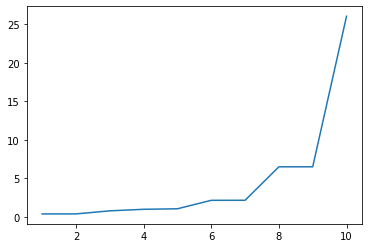

In [161]:
x = np.linspace(1, 10, 10)


y=[]
for k in range(10):
    g,var = approx1DGaussFilter1(k)
    y.append(var)

plt.plot(x, y)

*b*)

In [162]:
def approx1DGaussFilter2(var):
    val1 = int(3*var) 
    val2 = int(5*var) 
    val3 = int(7*var) 
    f1,v1 = approx1DGaussFilter1(val1)
    f2,v2 = approx1DGaussFilter1(val2)
    f3,v3 = approx1DGaussFilter1(val3)
    return f1, f2, f3

### q2.
*a*)

In [163]:
# Implementing gaussian filter
def gaussKernelGenerator(k_size, var):
    center = k_size 
    x, y = np.mgrid[0 - center : k_size - center, 0 - center : k_size - center]
    g = 1 / (2 * np.pi * var) * np.exp(-(np.square(x) + np.square(y)) / (2 * np.square(var)))
    g/=np.sum(g)
    return g

*b*)

In [164]:
def approx2DGaussFilter(var):
    f1,f2,f3 = approx1DGaussFilter2(var)
    
    f = np.array(f2)    
    f_t = np.array(f2).transpose()

    g_2d = np.outer(f, f_t)
    return g_2d

def convolve(image,mask):
    i_h,i_w = image.shape             # Extract the heights and width of the image
    k_h,k_w = mask.shape              # Pixels covered by the mask 
    
    output = np.zeros([i_h,i_w])
    
    padding_img = np.zeros([i_h+k_h-1,i_w+k_w-1])
    padding_img[int((k_h-1)/2):int(i_h+(k_h-1)/2),int((k_w-1)/2):int(i_w+(k_w-1)/2)] = image
    
    # Iterate over every pixel that can be covered by the mask
    for i in range(k_h,i_h+k_h):
        for j in range(k_w,i_w+k_w):
            area = padding_img[i-k_h:i,j-k_w:j]
            val = sum(sum(mask*area))
            output[i-k_h,j-k_w] = max(0,val)
    return np.int64(output)
 
def gaussianFilter(im, var, k):
    gaussker = gaussKernelGenerator(k,var=var)
    img_g = convolve(im,gaussker)
    return img_g


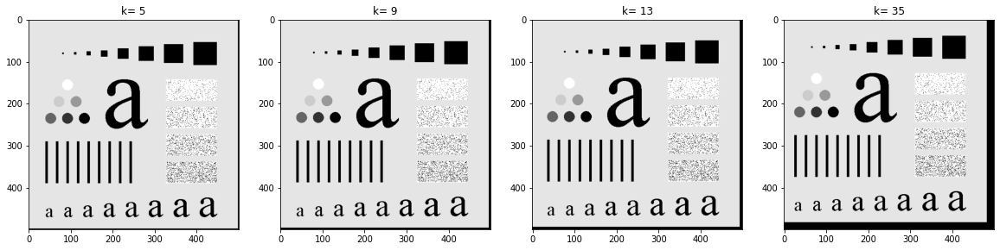

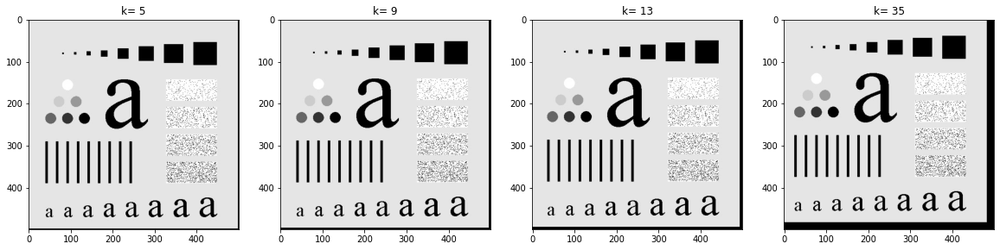

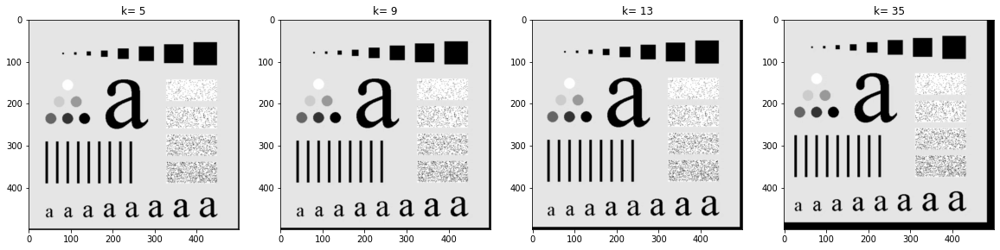

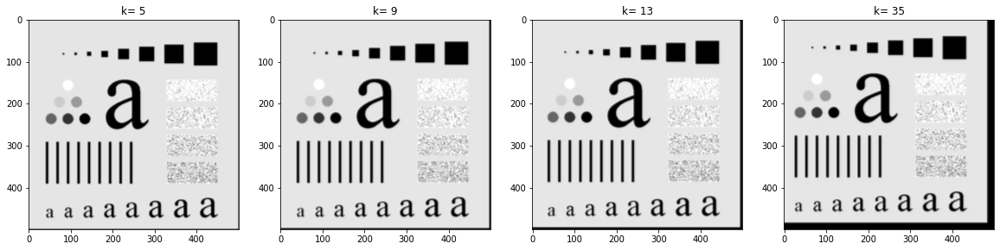

In [165]:
test = cv2.imread('../imgs/testPattern.jpg',0)
var = [0.2, 0.6, 1.2, 2.4]
ker = [5,9,13,35]

for v in (var):
 plt.figure(figsize = [20,10])
 for i in range(0,4):
    plt.subplot(1,4,i+1)
    plt.title("k= "+ str(ker[i]))
    plt.imshow(gaussianFilter(test,v,ker[i]),cmap = 'gray')
    
plt.show() 

The output is much clearer than the one obrained using the average filter which were extremely blured.

The role of variance in the Gaussian filter is to control the variation around its mean value. More the value of variance, more is the variation allowed around the mean.

## 7.2 Non Linear Filters
### q1.

In [166]:
# effMedianFilter
def countSort(f, sz):
  mid = 0
  for i in range(256):
    mid+=f[i]
    if(mid > sz/2):
      return i
  return 255

def effMedianFilter(image, k):
  row, column = image.shape
  if(k>row and k>column):
    return image
  
  sz = k*k
  pad = int(k/2)
  resultImage = np.zeros((row+2*pad, column+2*pad), dtype = np.int)
  resultImage[pad:resultImage.shape[0]-pad, pad:resultImage.shape[1]-pad] = image
  cpy = resultImage.copy()

  f = np.zeros(256, dtype = np.int)
  for i in range(pad, resultImage.shape[0]-pad):
    for j in range(pad, resultImage.shape[1]-pad):
      if i==pad and j==pad:
        for dr in range(k):
          for dc in range(k):
            f[cpy[dr][dc]]+=1
      elif j==pad:
        f[0:256] = 0
        for dr in range(i-pad, i+pad+1):
          for dc in range(j-pad, j+pad+1):
            f[cpy[dr][dc]]+=1
      else:
        for dr in range(i-pad, i+pad+1):
          f[cpy[dr][j-pad-1]]-=1
        for dc in range(i-pad, i+pad+1):
          f[cpy[dc][j+pad]]+=1
      resultImage[i][j] = countSort(f, sz)

  return np.rint(resultImage[pad:resultImage.shape[0]-pad, pad:resultImage.shape[1]-pad]).astype(np.uint8)

# maxFilter
def maxFilter(img,k):
    out = np.zeros_like(img)
    paddingNum = k//2

    xStart = paddingNum
    xEnd = img.shape[0]-paddingNum
    yStart = paddingNum
    yEnd = img.shape[1]-paddingNum

    for i in range(xStart,xEnd):
        for j in range(yStart,yEnd):
            vals = img[i-paddingNum:i+paddingNum+1,j-paddingNum:j+paddingNum+1]
            # vals = np.sort(vals,axis=None)
            index = np.max(vals)
            out[i,j] = index

    return out

# minFilter
def minFilter(img,k):
    out = np.zeros_like(img)
    paddingNum = k//2

    xStart = paddingNum
    xEnd = img.shape[0]-paddingNum
    yStart = paddingNum
    yEnd = img.shape[1]-paddingNum

    for i in range(xStart,xEnd):
        for j in range(yStart,yEnd):
            vals = img[i-paddingNum:i+paddingNum+1,j-paddingNum:j+paddingNum+1]
            # vals = np.sort(vals,axis=None)
            index = np.min(vals)
            out[i,j] = index

    return out

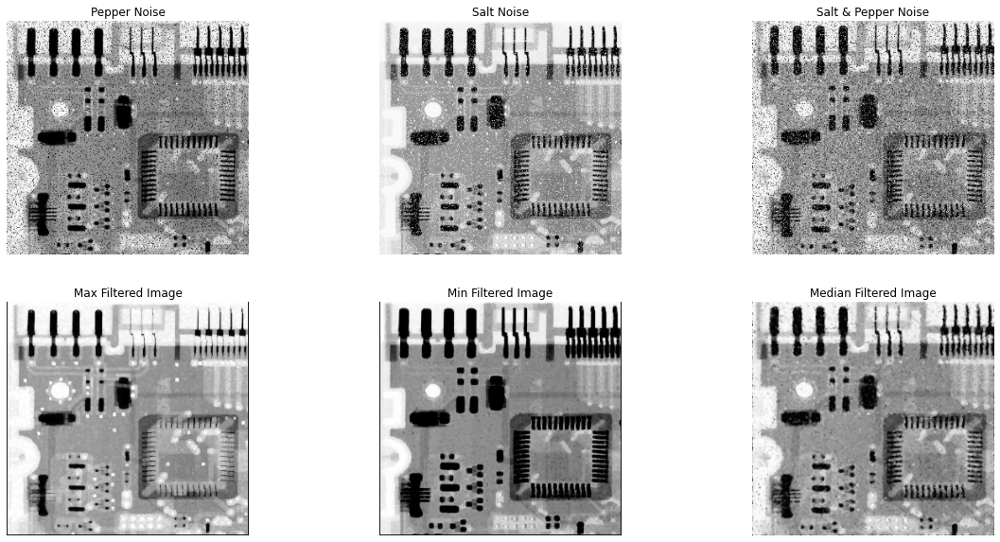

In [167]:
img1=cv2.imread("../imgs/noisy1.jpeg",0)
img2=cv2.imread("../imgs/noisy2.jpeg",0)
img3=cv2.imread("../imgs/noisy3.jpeg",0)

plt.figure(figsize = [20,10])
plt.subplot(231)
plt.imshow(img1, cmap = "gray")
plt.title("Pepper Noise")
plt.axis('off')
img1 = maxFilter(img1,3)
plt.subplot(234)
plt.imshow(img1, cmap = "gray")
plt.title("Max Filtered Image")
plt.axis('off')

plt.subplot(232)
plt.imshow(img2, cmap = "gray")
plt.title("Salt Noise")
plt.axis('off')
img2 = minFilter(img2,3)
plt.subplot(235)
plt.imshow(img2, cmap = "gray")
plt.title("Min Filtered Image")
plt.axis('off')

plt.subplot(233)
plt.imshow(img3, cmap = "gray")
plt.title("Salt & Pepper Noise")
plt.axis('off')
img3 = effMedianFilter(img3,3)
plt.subplot(236)
plt.imshow(img3, cmap = "gray")
plt.title("Median Filtered Image")
plt.axis('off')
plt.show() 

The min filter is used for salt noise because the salt noise is the presence of random high intensity pixels, and the min filter will never choose the high intensity pixels thus eliminating the noise.

Similarly, the max filter is used for the pepper noise, which are the random low intensity pixels.

For salt and pepper noise occuring concurrently, median filter is used. The median filter is more robust as compared to the mean filter because mean filter is affected by outliers.


### q2.

In [168]:
# code already written and used in q1.
def countSort(f, sz):
  mid = 0
  for i in range(256):
    mid+=f[i]
    if(mid > sz/2):
      return i
  return 255

def effMedianFilter(image, k):
  row, column = image.shape
  if(k>row and k>column):
    return image
  
  sz = k*k
  pad = int(k/2)
  resultImage = np.zeros((row+2*pad, column+2*pad), dtype = np.int)
  resultImage[pad:resultImage.shape[0]-pad, pad:resultImage.shape[1]-pad] = image
  cpy = resultImage.copy()

  f = np.zeros(256, dtype = np.int)
  for i in range(pad, resultImage.shape[0]-pad):
    for j in range(pad, resultImage.shape[1]-pad):
      if i==pad and j==pad:
        for dr in range(k):
          for dc in range(k):
            f[cpy[dr][dc]]+=1
      elif j==pad:
        f[0:256] = 0
        for dr in range(i-pad, i+pad+1):
          for dc in range(j-pad, j+pad+1):
            f[cpy[dr][dc]]+=1
      else:
        for dr in range(i-pad, i+pad+1):
          f[cpy[dr][j-pad-1]]-=1
        for dc in range(i-pad, i+pad+1):
          f[cpy[dc][j+pad]]+=1
      resultImage[i][j] = countSort(f, sz)

  return np.rint(resultImage[pad:resultImage.shape[0]-pad, pad:resultImage.shape[1]-pad]).astype(np.uint8)

(-0.5, 297.5, 299.5, -0.5)

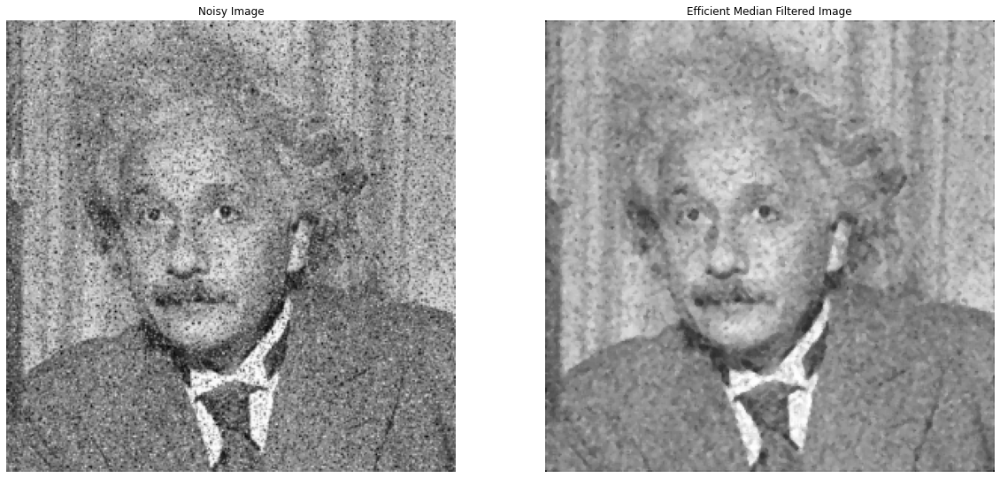

In [169]:
img =cv2.imread('../imgs/noisy.png',0)
fimg = effMedianFilter(img,3)

plt.figure(figsize = (20,10))
plt.subplot(121)
plt.imshow(img, cmap='gray')
plt.axis('off')
plt.title('Noisy Image')

plt.subplot(122)
plt.imshow(fimg, cmap='gray')
plt.title('Efficient Median Filtered Image')
plt.axis('off')

## 7.3 Edge Detection

In [170]:
def convolve(image,mask):
    i_h,i_w = image.shape             # Extract the heights and width of the image
    k_h,k_w = mask.shape              # Pixels covered by the mask 
    
    output = np.zeros([i_h,i_w])
    
    padding_img = np.zeros([i_h+k_h-1,i_w+k_w-1])
    padding_img[int((k_h-1)/2):int(i_h+(k_h-1)/2),int((k_w-1)/2):int(i_w+(k_w-1)/2)] = image
    
    # Iterate over every pixel that can be covered by the mask
    for i in range(k_h,i_h+k_h):
        for j in range(k_w,i_w+k_w):
            area = padding_img[i-k_h:i,j-k_w:j]
            val = sum(sum(mask*area))
            output[i-k_h,j-k_w] = max(0,val)

    
    return np.int64(output)

In [171]:
office =cv2.imread('../imgs/office.jpg',0)

*a*) Roberts:

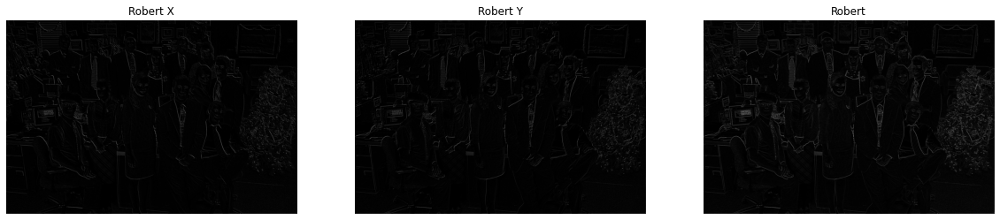

In [172]:
Robertx = np.array([[0,1],[-1,0]])
Roberty = np.array([[1,0],[0,-1]])
Robertxop = convolve(office,Robertx)
Robertyop = convolve(office,Roberty)
output = np.sqrt(Robertxop * Robertxop + Robertyop * Robertyop)
img = [Robertxop, Robertyop, output]

plt.figure(figsize = [20,10])
plt.subplot(131)
plt.imshow(img[0], cmap = "gray")
plt.title("Robert X")
plt.axis('off')
plt.subplot(132)
plt.imshow(img[1], cmap = "gray")
plt.title("Robert Y")
plt.axis('off')
plt.subplot(133)
plt.imshow(img[2], cmap = "gray")
plt.title("Robert")
plt.axis('off')
plt.show() 

*b*) Prewitt:

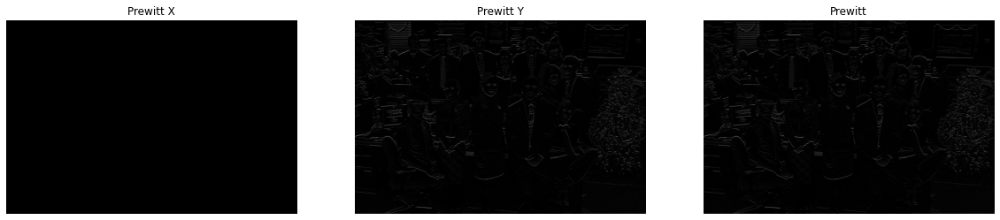

In [173]:
prewittx = np.array([[-1,0,-1],[-1,0,-1],[-1,0,-1]])
prewitty = np.array([[1,1,1],[0,0,0],[-1,-1,-1]])
prewittxop = convolve(office,prewittx)
prewittyop = convolve(office,prewitty)
output = np.sqrt(prewittxop * prewittxop + prewittyop * prewittyop)
img = [ prewittxop, prewittyop, output]

plt.figure(figsize = [20,10])
plt.subplot(131)
plt.imshow(img[0], cmap = "gray")
plt.title("Prewitt X")
plt.axis('off')
plt.subplot(132)
plt.imshow(img[1], cmap = "gray")
plt.title("Prewitt Y")
plt.axis('off')
plt.subplot(133)
plt.imshow(img[2], cmap = "gray")
plt.title("Prewitt")
plt.axis('off')
plt.show() 

*c*) Sobel:

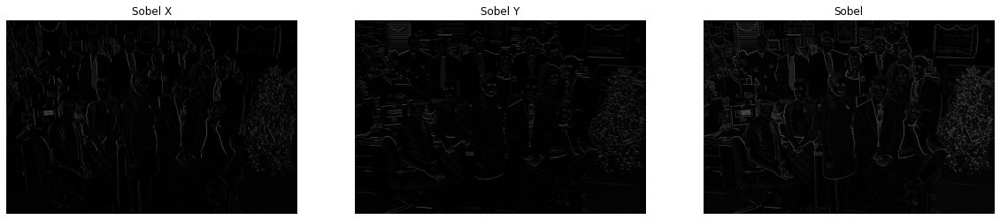

In [174]:
sobelx = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
sobely = np.array([[1,2,1],[0,0,0],[-1,-2,-1]])
sobelxop = convolve(office,sobelx)
sobelyop = convolve(office,sobely)
output = np.sqrt(sobelxop * sobelxop + sobelyop * sobelyop)
img = [sobelxop, sobelyop, output]

plt.figure(figsize = [20,10])
plt.subplot(131)
plt.imshow(img[0], cmap = "gray")
plt.title("Sobel X")
plt.axis('off')
plt.subplot(132)
plt.imshow(img[1], cmap = "gray")
plt.title("Sobel Y")
plt.axis('off')
plt.subplot(133)
plt.imshow(img[2], cmap = "gray")
plt.title("Sobel")
plt.axis('off')
plt.show() 

*d*) Laplacian:

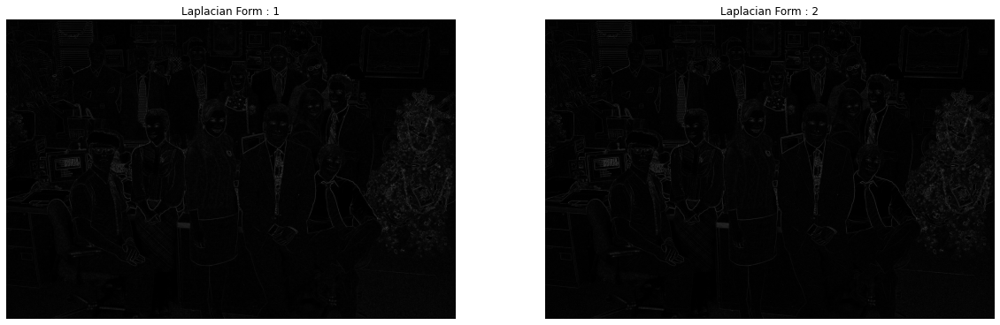

In [175]:
Laplacianx = np.array([[0,1,0],[1,-4,1],[0,1,0]])
Laplaciany = np.array([[1,1,1],[1,-8,1],[1,1,1]])

#  Laplace uses one symmetrical kernel instead of x and y gradients
Laplacianxop = convolve(office,Laplacianx)
Laplacianyop = convolve(office,Laplaciany)
img = [Laplacianxop, Laplacianyop]

plt.figure(figsize = [20,10])
plt.subplot(121)
plt.imshow(img[0], cmap = "gray")
plt.title("Laplacian Form : 1")
plt.axis('off')
plt.subplot(122)
plt.imshow(img[1], cmap = "gray")
plt.title("Laplacian Form : 2")
plt.axis('off')

plt.show() 


The observations made by comparing the output magnitude and direction images is that **Sobel detects edges better as compared to prewitt**, as it gives more emphasis on pixels that are closer to the centre of the mask. 


### q2.

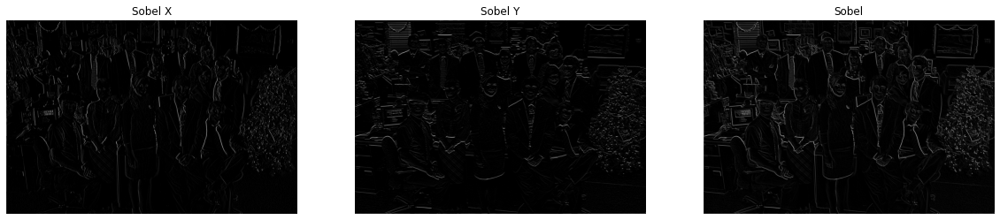

In [176]:
prewitt5x = np.array([[-1, -1, 0, 1, 1], [-1, -1, 0, 1, 1], [-1, -1, 0, 1, 1], [-1, -1, 0, 1, 1], [-1, -1, 0, 1, 1]])
prewitt5y = np.array([[1, 1, 1, 1, 1], [1, 1, 1, 1, 1], [0, 0, 0, 0, 0], [-1, -1, -1, -1, -1], [-1, -1, -1, -1, -1]])
sobel5x = np.array([[-2,-1, 0, 1, 2], [-2,-1, 0, 1, 2], [-4,-2, 0, 2, 4],[-2,-1, 0, 1, 2], [-2,-1, 0, 1, 2]])
sobel5y = np.array([[2, 2, 4, 2, 2], [1, 1, 2, 1, 1], [0, 0, 0, 0, 0], [-1, -1, -2, -1, -1], [-2, -2, -4, -2, -2]])

# 5x5 sobel
sobelxop = convolve(office,sobel5x)
sobelyop = convolve(office,sobel5y)
output = np.sqrt(sobelxop * sobelxop + sobelyop * sobelyop)
img = [sobelxop, sobelyop, output]

plt.figure(figsize = [20,10])
plt.subplot(131)
plt.imshow(img[0], cmap = "gray")
plt.title("Sobel X")
plt.axis('off')
plt.subplot(132)
plt.imshow(img[1], cmap = "gray")
plt.title("Sobel Y")
plt.axis('off')
plt.subplot(133)
plt.imshow(img[2], cmap = "gray")
plt.title("Sobel")
plt.axis('off')
plt.show() 

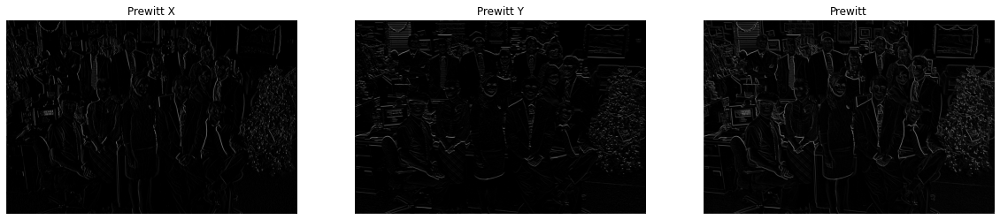

In [177]:
prewittxop = convolve(office,prewitt5x)
prewittyop = convolve(office,prewitt5y)
output = np.sqrt(prewittxop * prewittxop + prewittyop * prewittyop)
img = [prewittxop, prewittyop, output]

plt.figure(figsize = [20,10])
plt.subplot(131)
plt.imshow(img[0], cmap = "gray")
plt.title("Prewitt X")
plt.axis('off')
plt.subplot(132)
plt.imshow(img[1], cmap = "gray")
plt.title("Prewitt Y")
plt.axis('off')
plt.subplot(133)
plt.imshow(img[2], cmap = "gray")
plt.title("Prewitt")
plt.axis('off')
plt.show() 


We observe that the 5x5 filters follow a similar pattern as already seen with 3x3 filters i.e. Sobel detects edges better as compared to prewitt, as it gives more emphasis on pixels that are closer to the centre of the mask. Also the edges are more defined using the 5x5 filter compared to 3x3 filter.


### q3.

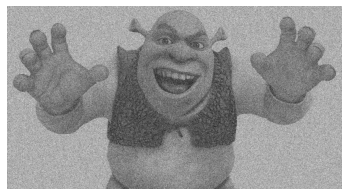

In [178]:
cur = cv2.imread('../imgs/img2.jpg',0)
np.random.seed(42)
noise = np.random.normal(0.0, 42, cur.shape)
noise_cur = cur.astype(np.float64)+noise

plt.imshow(noise_cur,cmap='gray')
plt.axis('off')
plt.show()

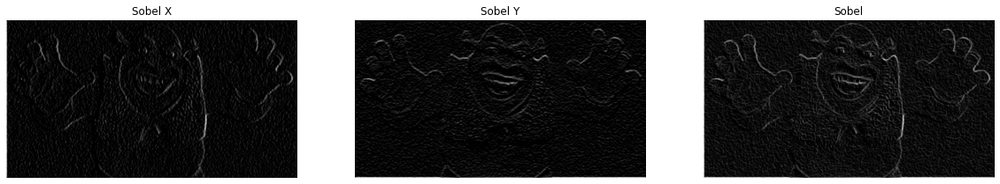

In [179]:
prewitt5x = np.array([[-1, -1, 0, 1, 1], [-1, -1, 0, 1, 1], [-1, -1, 0, 1, 1], [-1, -1, 0, 1, 1], [-1, -1, 0, 1, 1]])
prewitt5y = np.array([[1, 1, 1, 1, 1], [1, 1, 1, 1, 1], [0, 0, 0, 0, 0], [-1, -1, -1, -1, -1], [-1, -1, -1, -1, -1]])
sobel5x = np.array([[-2,-1, 0, 1, 2], [-2,-1, 0, 1, 2], [-4,-2, 0, 2, 4],[-2,-1, 0, 1, 2], [-2,-1, 0, 1, 2]])
sobel5y = np.array([[2, 2, 4, 2, 2], [1, 1, 2, 1, 1], [0, 0, 0, 0, 0], [-1, -1, -2, -1, -1], [-2, -2, -4, -2, -2]])

# 5x5 sobel
sobelxop = convolve(noise_cur,sobel5x)
sobelyop = convolve(noise_cur,sobel5y)
output = np.sqrt(sobelxop * sobelxop + sobelyop * sobelyop)
img = [sobelxop, sobelyop, output]

plt.figure(figsize = [20,10])
plt.subplot(131)
plt.imshow(img[0], cmap = "gray")
plt.title("Sobel X")
plt.axis('off')
plt.subplot(132)
plt.imshow(img[1], cmap = "gray")
plt.title("Sobel Y")
plt.axis('off')
plt.subplot(133)
plt.imshow(img[2], cmap = "gray")
plt.title("Sobel")
plt.axis('off')
plt.show() 

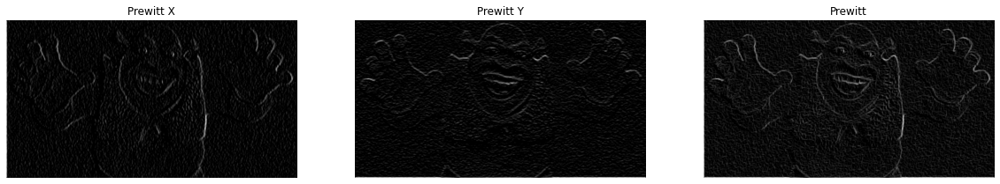

In [180]:
prewittxop = convolve(noise_cur,prewitt5x)
prewittyop = convolve(noise_cur,prewitt5y)
output = np.sqrt(prewittxop * prewittxop + prewittyop * prewittyop)
img = [prewittxop, prewittyop, output]

plt.figure(figsize = [20,10])
plt.subplot(131)
plt.imshow(img[0], cmap = "gray")
plt.title("Prewitt X")
plt.axis('off')
plt.subplot(132)
plt.imshow(img[1], cmap = "gray")
plt.title("Prewitt Y")
plt.axis('off')
plt.subplot(133)
plt.imshow(img[2], cmap = "gray")
plt.title("Prewitt")
plt.axis('off')
plt.show() 


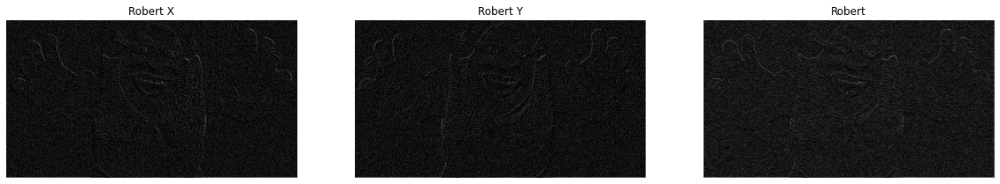

In [181]:
Robertx = np.array([[0,1],[-1,0]])
Roberty = np.array([[1,0],[0,-1]])
Robertxop = convolve(noise_cur,Robertx)
Robertyop = convolve(noise_cur,Roberty)
output = np.sqrt(Robertxop * Robertxop + Robertyop * Robertyop)
img = [Robertxop, Robertyop, output]

plt.figure(figsize = [20,10])
plt.subplot(131)
plt.imshow(img[0], cmap = "gray")
plt.title("Robert X")
plt.axis('off')
plt.subplot(132)
plt.imshow(img[1], cmap = "gray")
plt.title("Robert Y")
plt.axis('off')
plt.subplot(133)
plt.imshow(img[2], cmap = "gray")
plt.title("Robert")
plt.axis('off')
plt.show() 

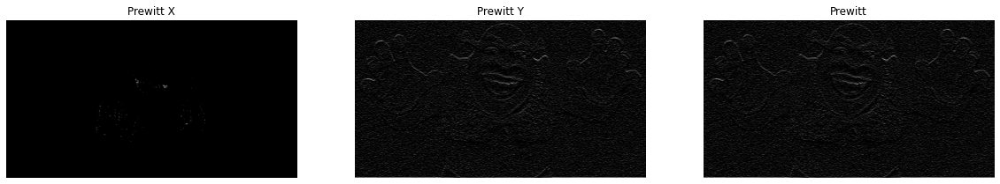

In [182]:
prewittx = np.array([[-1,0,-1],[-1,0,-1],[-1,0,-1]])
prewitty = np.array([[1,1,1],[0,0,0],[-1,-1,-1]])
prewittxop = convolve(noise_cur,prewittx)
prewittyop = convolve(noise_cur,prewitty)
output = np.sqrt(prewittxop * prewittxop + prewittyop * prewittyop)
img = [ prewittxop, prewittyop, output]

plt.figure(figsize = [20,10])
plt.subplot(131)
plt.imshow(img[0], cmap = "gray")
plt.title("Prewitt X")
plt.axis('off')
plt.subplot(132)
plt.imshow(img[1], cmap = "gray")
plt.title("Prewitt Y")
plt.axis('off')
plt.subplot(133)
plt.imshow(img[2], cmap = "gray")
plt.title("Prewitt")
plt.axis('off')
plt.show() 

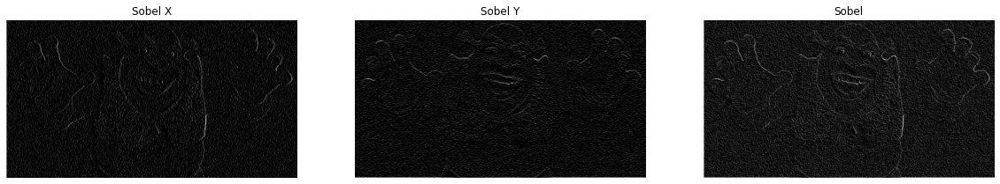

In [183]:
sobelx = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
sobely = np.array([[1,2,1],[0,0,0],[-1,-2,-1]])
sobelxop = convolve(noise_cur,sobelx)
sobelyop = convolve(noise_cur,sobely)
output = np.sqrt(sobelxop * sobelxop + sobelyop * sobelyop)
img = [sobelxop, sobelyop, output]

plt.figure(figsize = [20,10])
plt.subplot(131)
plt.imshow(img[0], cmap = "gray")
plt.title("Sobel X")
plt.axis('off')
plt.subplot(132)
plt.imshow(img[1], cmap = "gray")
plt.title("Sobel Y")
plt.axis('off')
plt.subplot(133)
plt.imshow(img[2], cmap = "gray")
plt.title("Sobel")
plt.axis('off')
plt.show() 

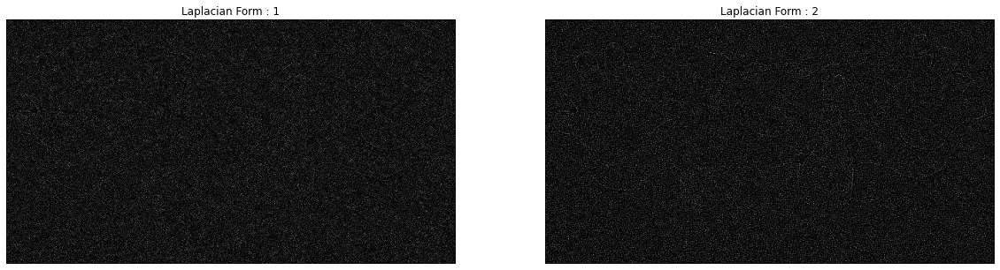

In [184]:
Laplacianx = np.array([[0,1,0],[1,-4,1],[0,1,0]])
Laplaciany = np.array([[1,1,1],[1,-8,1],[1,1,1]])

#  Laplace uses one symmetrical kernel instead of x and y gradients
Laplacianxop = convolve(noise_cur,Laplacianx)
Laplacianyop = convolve(noise_cur,Laplaciany)
img = [Laplacianxop, Laplacianyop]

plt.figure(figsize = [20,10])
plt.subplot(121)
plt.imshow(img[0], cmap = "gray")
plt.title("Laplacian Form : 1")
plt.axis('off')
plt.subplot(122)
plt.imshow(img[1], cmap = "gray")
plt.title("Laplacian Form : 2")
plt.axis('off')

plt.show() 


 Hence, we observe that filters like Laplacian are less robust to noise, that is, the output image in the case of noisy images is much worse than the other filters. 

## 8. Processing the Galaxies

We make use of threshold function to turn the image into a black and white image. 

(-0.5, 2757.5, 2566.5, -0.5)

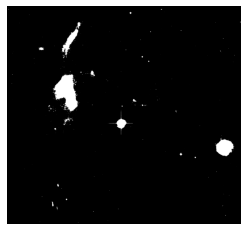

In [185]:
img = cv2.imread('../imgs/galaxies.jpeg',0)
def threshhold(im,k):
    len, bre = im.shape
    for i in range(len):
        for j in range(bre):
            if im[i][j] > k:
                im[i][j] = 255
            else:
                im[i][j] = 0
    return im


img_t = threshhold(img,120)
plt.imshow(img_t, cmap="gray")
plt.axis('off')

As can be observed, there is a lot of salt noise in the image, thus, we can make use of **Min Filter**.

(-0.5, 2757.5, 2566.5, -0.5)

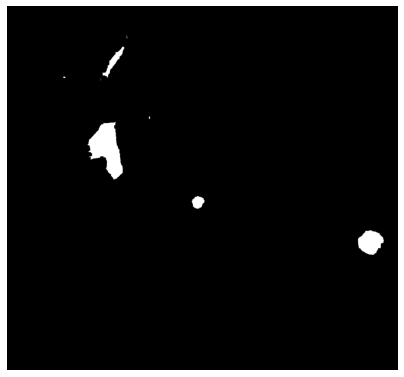

In [186]:
img  = minFilter(img_t, 19)
plt.figure(figsize= [7,7])
plt.subplot(111)
plt.imshow(img, cmap="gray")
plt.axis('off')